<a href="https://colab.research.google.com/github/tomorn112/ZC-DINO-ER/blob/part1/YOLOv8seg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Zero-Shot Eggshell Crack Detection Using Grounding DINO and FFT-Based Outer-to-Inner Ring Energy Ratio**
### This repository contains the supplementary code for the journal submitted to IEEE Access (2025) titled: "Zero-Shot Eggshell Crack Detection Using Grounding DINO and FFT-Based Outer-to-Inner Ring Energy Ratio".
# **Part: 1 Cropped and Removed Background using YOLOv8s-seg**
###This section provides the implementation for preprocessing eggshell images by cropping and removing backgrounds using GroundedSAM. The processed images serve as input for the subsequent zero-shot crack detection pipeline.
##Features:
###GroundedSAM-based segmentation: Automatically detects and removes image backgrounds.
###Preprocessing pipeline: Prepares images for further analysis using FFT-based feature extraction.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

!nvidia-smi

Fri Mar 21 09:36:33 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P0             48W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
!python --version

Python 3.11.11


In [ ]:

import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install supervision ultralytics --upgrade


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.0/950.0 kB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 33.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 40.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink

In [ ]:
!wget https://huggingface.co/jags/yolov8_model_segmentation-set/resolve/main/yolov8n-seg.pt



--2025-03-29 14:20:26--  https://huggingface.co/jags/yolov8_model_segmentation-set/resolve/main/yolov8n-seg.pt
Resolving huggingface.co (huggingface.co)... 18.239.50.103, 18.239.50.80, 18.239.50.49, ...
Connecting to huggingface.co (huggingface.co)|18.239.50.103|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs-us-1.hf.co/repos/e6/31/e63189bdb2ac82274f686f6e5773b3748166f271394f37c908d6707851b52bb9/d39e867b2c3a5dbc1aa764411544b475cb14727bf6af1ec46c238f8bb1351ab9?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27yolov8n-seg.pt%3B+filename%3D%22yolov8n-seg.pt%22%3B&Expires=1743261626&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTc0MzI2MTYyNn19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy11cy0xLmhmLmNvL3JlcG9zL2U2LzMxL2U2MzE4OWJkYjJhYzgyMjc0ZjY4NmY2ZTU3NzNiMzc0ODE2NmYyNzEzOTRmMzdjOTA4ZDY3MDc4NTFiNTJiYjkvZDM5ZTg2N2IyYzNhNWRiYzFhYTc2NDQxMTU0NGI0NzVjYjE0NzI3YmY2YWYxZWM0NmMyMzhmOGJiMTM1MWFiOT9yZXNwb25z

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

image 1/1 /content/drive/MyDrive/Thesis/Egg/Egg_pic/IMG_6281.jpeg: 640x480 30 oranges, 66.4ms
Speed: 19.0ms preprocess, 66.4ms inference, 420.4ms postprocess per image at shape (1, 3, 640, 480)


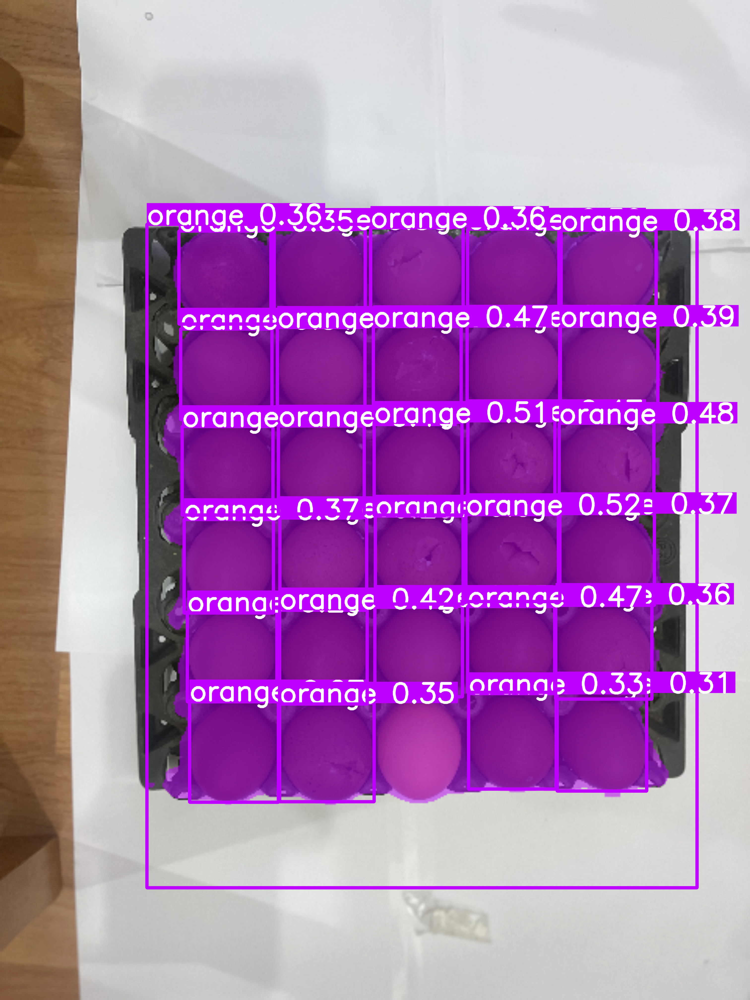

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load the model
model = YOLO("yolov8n-seg.pt")

# Run inference on an image
results = model("/content/drive/MyDrive/Thesis/Egg/Egg_pic/IMG_6281.jpeg")  # Replace with your image path

# Show results
for result in results:
    result.show()  # Display image with segmentation overlay


In [ ]:
print(f"Model parameters: {sum(p.numel() for p in model.model.parameters())}")


Model parameters: 3404320


In [ ]:
model_parameters = sum(p.numel() for p in model.model.parameters())

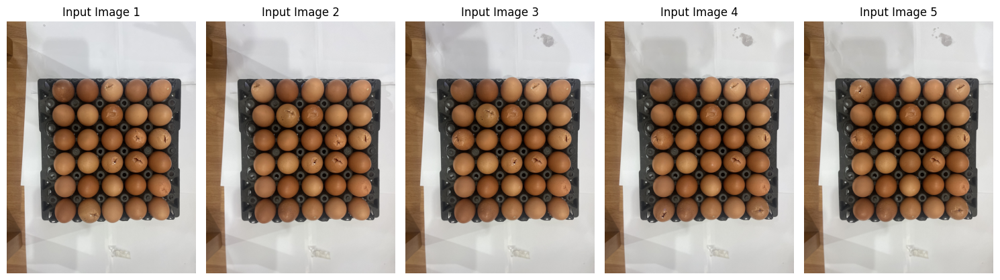

In [ ]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# Ensure dataset paths are correctly defined
IMAGE_DIR_PATH = "/content/drive/MyDrive/Thesis/Egg/Egg_pic"

# Select a few input images to display
num_display = 5  # Display up to 5 images
image_names = sorted([f for f in os.listdir(IMAGE_DIR_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
selected_images = image_names[:num_display]

# Plot selected input images
fig, axes = plt.subplots(1, num_display, figsize=(15, 5))

for idx, image_name in enumerate(selected_images):
    image_path = os.path.join(IMAGE_DIR_PATH, image_name)
    image = Image.open(image_path)

    axes[idx].imshow(image)
    axes[idx].set_title(f"Input Image {idx+1}")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
!pip install psutil


🔍 YOLOv8s-seg Parameter Count:  0
📸 Processing: /content/drive/MyDrive/Thesis/Egg/1/IMG_6287.jpeg


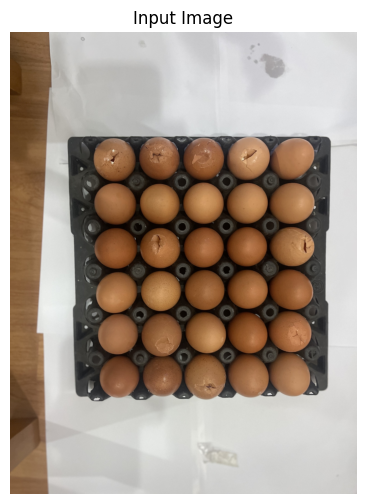


image 1/1 /content/drive/MyDrive/Thesis/Egg/1/IMG_6287.jpeg: 640x480 31 oranges, 386.1ms
Speed: 15.0ms preprocess, 386.1ms inference, 109.6ms postprocess per image at shape (1, 3, 640, 480)
✅ Saved segmented egg 0: /content/no_background_eggshell/eggshell_0.png
✅ Saved segmented egg 1: /content/no_background_eggshell/eggshell_1.png
✅ Saved segmented egg 2: /content/no_background_eggshell/eggshell_2.png
✅ Saved segmented egg 3: /content/no_background_eggshell/eggshell_3.png
✅ Saved segmented egg 4: /content/no_background_eggshell/eggshell_4.png
✅ Saved segmented egg 5: /content/no_background_eggshell/eggshell_5.png
✅ Saved segmented egg 6: /content/no_background_eggshell/eggshell_6.png
✅ Saved segmented egg 7: /content/no_background_eggshell/eggshell_7.png
✅ Saved segmented egg 8: /content/no_background_eggshell/eggshell_8.png
✅ Saved segmented egg 9: /content/no_background_eggshell/eggshell_9.png
✅ Saved segmented egg 10: /content/no_background_eggshell/eggshell_10.png
✅ Saved segment

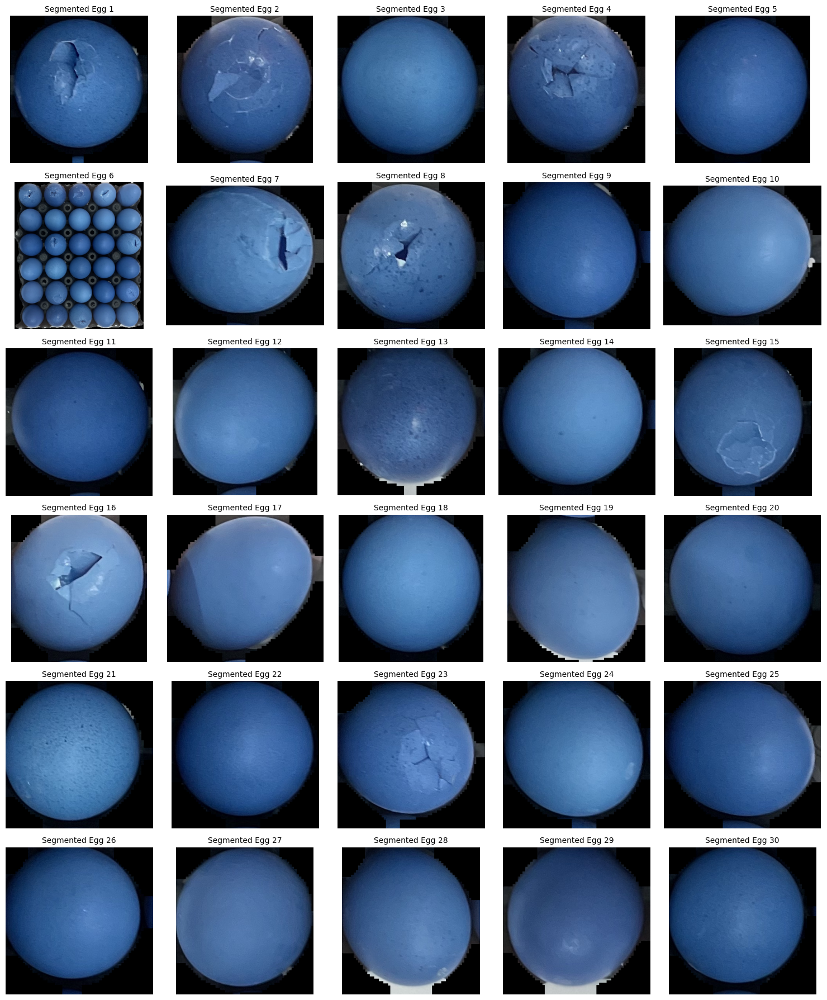

✅ Segmentation and background removal completed!


In [ ]:
import os
import cv2
import torch
import time
import numpy as np
import psutil  # ✅ For CPU and Memory Usage
from ultralytics import YOLO
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# ✅ Ensure YOLOv8-Seg Model is Available
MODEL_PATH = "yolov8n-seg.pt"
if not os.path.exists(MODEL_PATH):
    print("🚀 Downloading YOLOv8-Seg model...")
    os.system("wget https://huggingface.co/jags/yolov8_model_segmentation-set/resolve/main/yolov8n-seg.pt")

# ✅ Define input and output directories
#IMAGE_DIR_PATH = "/content/drive/MyDrive/Thesis/Egg/Egg_pic"
IMAGE_DIR_PATH = "/content/drive/MyDrive/Thesis/Egg/1"
OUTPUT_DIR = "/content/no_background_eggshell/"  # Output for segmented eggshells

# ✅ Ensure directories exist
Path(OUTPUT_DIR).mkdir(parents=True, exist_ok=True)

# ✅ Load YOLOv8-Seg Model
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = YOLO(MODEL_PATH).to(device)

# ✅ Get Model Parameter Count
model_parameters = sum(p.numel() for p in model.model.parameters() if p.requires_grad)
print(f"🔍 YOLOv8s-seg Parameter Count:  {model_parameters}")

# ✅ Get Only One Image
image_names = sorted([f for f in os.listdir(IMAGE_DIR_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
if len(image_names) == 0:
    print("❌ No images found in the directory!")
    exit()

image_name = image_names[0]  # Select only the first image
image_path = os.path.join(IMAGE_DIR_PATH, image_name)

print(f"📸 Processing: {image_path}")

# ✅ Load Original Image
image = cv2.imread(image_path)
if image is None:
    print(f"❌ Error loading {image_name}, exiting...")
    exit()

original_height, original_width = image.shape[:2]  # Save original dimensions

# ✅ Display the Input Image
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Input Image")
plt.axis("off")
plt.show()

# ✅ Measure Inference Time and GPU/CPU/Memory Usage
start_time = time.time()
if device == 'cuda':
    torch.cuda.reset_max_memory_allocated()

# ✅ Capture CPU and Memory stats before inference
cpu_before = psutil.cpu_percent(interval=None)
memory_before = psutil.Process(os.getpid()).memory_info().rss / (1024 ** 2)  # in MB

# ✅ Run model
results = model(image_path, imgsz=640, device=device, conf=0.2, iou=0.2)

# ✅ Capture CPU and Memory stats after inference
cpu_after = psutil.cpu_percent(interval=None)
memory_after = psutil.Process(os.getpid()).memory_info().rss / (1024 ** 2)  # in MB

latency = time.time() - start_time  # Calculate total inference time

# ✅ Measure GPU memory usage (if applicable)
gpu_memory_used = torch.cuda.max_memory_allocated() / (1024 ** 2) if device == 'cuda' else 0

if len(results) == 0:
    print(f"⚠️ No detections found for {image_name}, exiting...")
    exit()

# ✅ Extract and Process Each Mask
masks = results[0].masks
if masks is None or len(masks.data) == 0:
    print(f"❌ No valid mask found for {image_name}, exiting...")
    exit()

segmented_images = []
for j, mask in enumerate(masks.data):  # Loop through all detected eggs
    mask = mask.cpu().numpy().astype(np.uint8)
    mask = np.squeeze(mask) * 255  # Convert to binary mask (0 or 255)

    # ✅ Resize Mask to Match Original Image Size
    mask_resized = cv2.resize(mask, (original_width, original_height), interpolation=cv2.INTER_NEAREST)
    mask_3ch_resized = np.stack([mask_resized] * 3, axis=-1)

    # ✅ Apply Mask to Extract Eggshell Only
    masked_image = np.where(mask_3ch_resized > 0, image, 0)

    # ✅ Find Bounding Box and Crop
    rows = np.any(mask_resized, axis=1)
    cols = np.any(mask_resized, axis=0)

    if not np.any(rows) or not np.any(cols):
        print(f"⚠️ Empty mask detected for {image_name} (Mask {j}), skipping cropping...")
        continue

    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]
    cropped_image = masked_image[rmin:rmax, cmin:cmax]

    # ✅ Save Each Cropped Eggshell Separately
    save_path = os.path.join(OUTPUT_DIR, f"eggshell_{j}.png")
    Image.fromarray(cropped_image).save(save_path)
    segmented_images.append(cropped_image)
    print(f"✅ Saved segmented egg {j}: {save_path}")

# ✅ Calculate FPS
fps = 1 / latency if latency > 0 else 0
cpu_usage = (cpu_before + cpu_after) / 2  # average usage during inference
memory_usage = memory_after - memory_before  # memory increase during inference

# ✅ Display Performance Metrics
print("\n================ Performance Summary ================")
print(f"Device Used: {device}")
print(f"YOLOv8s-seg Parameter Count: {model_parameters}")
print(f"Average Latency: {latency:.4f} sec")
print(f"Average FPS: {fps:.2f}")
print(f"CPU Usage: {cpu_usage:.2f}%")
print(f"Memory Usage (RAM): {memory_usage:.2f} MB")
if device == 'cuda':
    print(f"Average GPU Memory Usage: {gpu_memory_used:.2f} MB")
print("===================================================\n")

# ✅ Display Segmented Outputs (Corrected Grid Layout)
num_display = min(len(segmented_images), 30)  # Show up to 30 segmented eggs
cols = 5  # 5 columns per row
rows = (num_display // cols) + (1 if num_display % cols else 0)  # Adjust rows

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
axes = axes.flatten()

for idx in range(num_display):
    axes[idx].imshow(segmented_images[idx])
    axes[idx].set_title(f"Segmented Egg {idx+1}", fontsize=10)
    axes[idx].axis("off")

# Hide any extra subplot axes
for idx in range(num_display, len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

print("✅ Segmentation and background removal completed!")


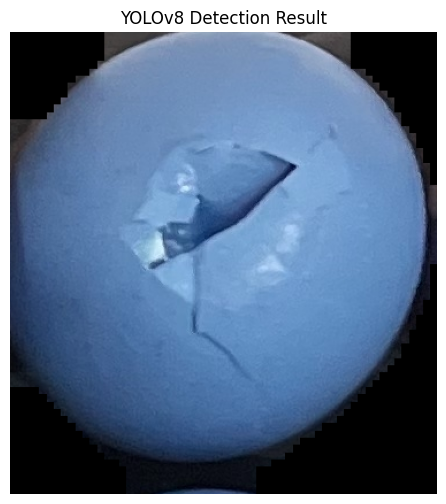

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load image from Google Drive
img_path = "/content/no_background_eggshell/eggshell_15.png"
img_bgr = cv2.imread(img_path)

# Convert from BGR to RGB for display
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Display using matplotlib
plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)
plt.axis('off')
plt.title("YOLOv8 Detection Result")
plt.show()

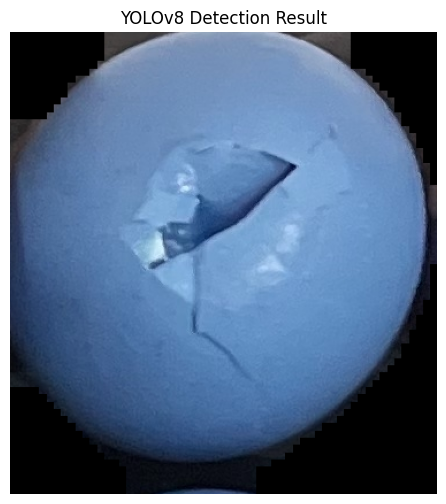

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load image from Google Drive with alpha channel support
img_path = "/content/no_background_eggshell/eggshell_15.png"
img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)

if img is None:
    raise ValueError("Image not found at " + img_path)

# Check the image shape to see if it has an alpha channel (4 channels) or not (3 channels)
if len(img.shape) == 3:
    if img.shape[2] == 4:
        # Convert BGRA to RGBA if image contains an alpha channel
        img_converted = cv2.cvtColor(img, cv2.COLOR_BGRA2RGBA)
    else:
        # Convert BGR to RGB for normal 3-channel images
        img_converted = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
else:
    # If the image is grayscale or does not meet expected channel count, use as is
    img_converted = img

# Display the converted image using matplotlib
plt.figure(figsize=(8, 6))
plt.imshow(img_converted)
plt.axis('off')
plt.title("YOLOv8 Detection Result")
plt.show()


🔍 YOLOv8s-seg Parameter Count:  0
📸 Processing: /content/drive/MyDrive/Thesis/Egg/Egg_pic/IMG_6281.jpeg


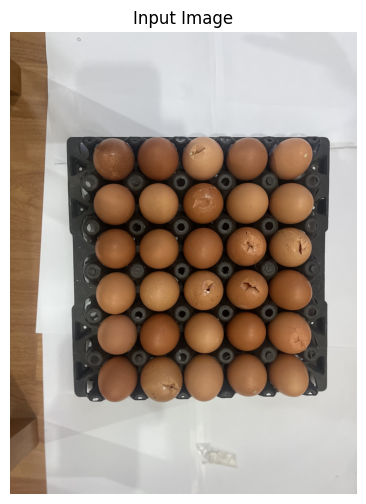


image 1/1 /content/drive/MyDrive/Thesis/Egg/Egg_pic/IMG_6281.jpeg: 640x480 30 oranges, 155.6ms
Speed: 2.3ms preprocess, 155.6ms inference, 32.8ms postprocess per image at shape (1, 3, 640, 480)
✅ Saved segmented egg 0: /content/no_background_eggshell/eggshell_0.png
✅ Saved segmented egg 1: /content/no_background_eggshell/eggshell_1.png
✅ Saved segmented egg 2: /content/no_background_eggshell/eggshell_2.png
✅ Saved segmented egg 3: /content/no_background_eggshell/eggshell_3.png
✅ Saved segmented egg 4: /content/no_background_eggshell/eggshell_4.png
✅ Saved segmented egg 5: /content/no_background_eggshell/eggshell_5.png
✅ Saved segmented egg 6: /content/no_background_eggshell/eggshell_6.png
✅ Saved segmented egg 7: /content/no_background_eggshell/eggshell_7.png
✅ Saved segmented egg 8: /content/no_background_eggshell/eggshell_8.png
✅ Saved segmented egg 9: /content/no_background_eggshell/eggshell_9.png
✅ Saved segmented egg 10: /content/no_background_eggshell/eggshell_10.png
✅ Saved seg

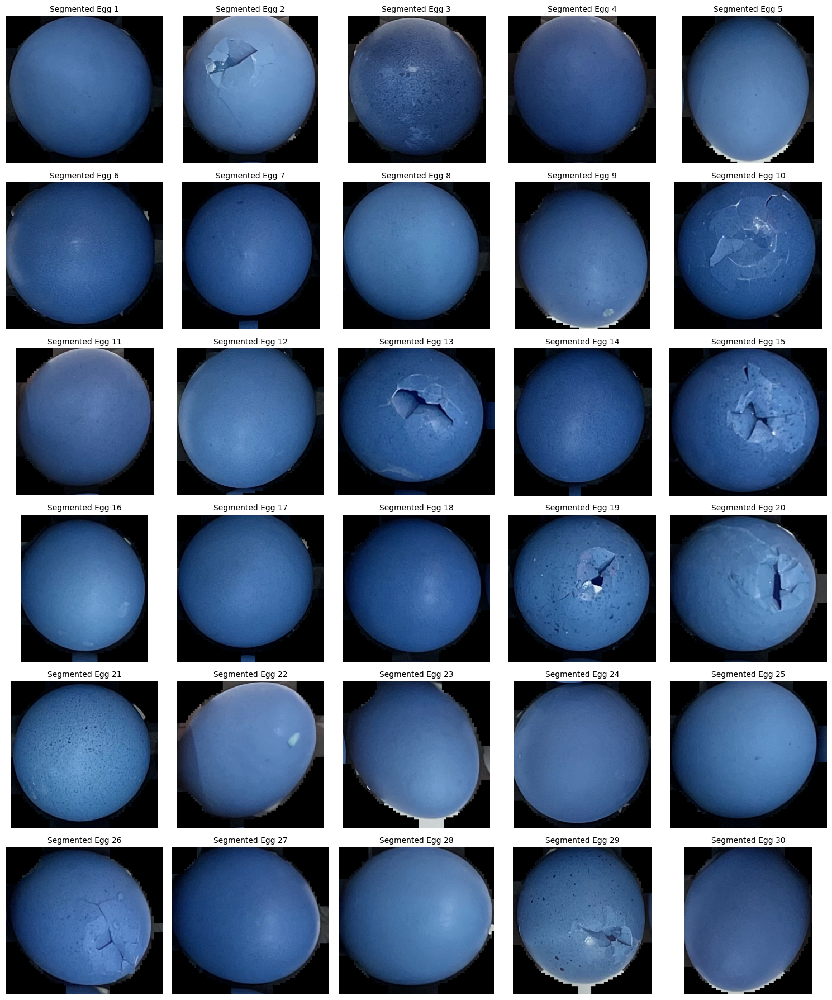

✅ Segmentation and background removal completed!


In [ ]:
import os
import cv2
import torch
import time
import numpy as np
from ultralytics import YOLO
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# ✅ Ensure YOLOv8-Seg Model is Available
MODEL_PATH = "yolov8s-seg.pt"
if not os.path.exists(MODEL_PATH):
    print("🚀 Downloading YOLOv8-Seg model...")
    !wget https://huggingface.co/jags/yolov8_model_segmentation-set/resolve/main/yolov8s-seg.pt

# ✅ Define input and output directories
IMAGE_DIR_PATH = "/content/drive/MyDrive/Thesis/Egg/Egg_pic"
OUTPUT_DIR = "/content/no_background_eggshell/"  # Output for segmented eggshells

# ✅ Ensure directories exist
Path(OUTPUT_DIR).mkdir(parents=True, exist_ok=True)

# ✅ Load YOLOv8-Seg Model
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = YOLO(MODEL_PATH).to(device)

# ✅ Get Model Parameter Count

#model_parameters = sum(p.numel() for p in model.model.parameters() if p.requires_grad)
print(f"🔍 YOLOv8s-seg Parameter Count:  {model_parameters}")

# ✅ Get Only One Image
image_names = sorted([f for f in os.listdir(IMAGE_DIR_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
if len(image_names) == 0:
    print("❌ No images found in the directory!")
    exit()

image_name = image_names[0]  # Select only the first image
image_path = os.path.join(IMAGE_DIR_PATH, image_name)

print(f"📸 Processing: {image_path}")

# ✅ Load Original Image
image = cv2.imread(image_path)
if image is None:
    print(f"❌ Error loading {image_name}, exiting...")
    exit()

original_height, original_width = image.shape[:2]  # Save original dimensions

# ✅ Display the Input Image
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Input Image")
plt.axis("off")
plt.show()

# ✅ Measure Inference Time and GPU Memory Usage
start_time = time.time()
if device == 'cuda':
    torch.cuda.reset_max_memory_allocated()

results = model(image_path, imgsz=640, device=device, conf=0.2, iou=0.2)
latency = time.time() - start_time  # Calculate total inference time

# ✅ Measure GPU memory usage (if applicable)
gpu_memory_used = torch.cuda.max_memory_allocated() / (1024 ** 2) if device == 'cuda' else 0

if len(results) == 0:
    print(f"⚠️ No detections found for {image_name}, exiting...")
    exit()

# ✅ Extract and Process Each Mask
masks = results[0].masks
if masks is None or len(masks.data) == 0:
    print(f"❌ No valid mask found for {image_name}, exiting...")
    exit()

segmented_images = []
for j, mask in enumerate(masks.data):  # Loop through all detected eggs
    mask = mask.cpu().numpy().astype(np.uint8)
    mask = np.squeeze(mask) * 255  # Convert to binary mask (0 or 255)

    # ✅ Resize Mask to Match Original Image Size
    mask_resized = cv2.resize(mask, (original_width, original_height), interpolation=cv2.INTER_NEAREST)
    mask_3ch_resized = np.stack([mask_resized] * 3, axis=-1)

    # ✅ Apply Mask to Extract Eggshell Only
    masked_image = np.where(mask_3ch_resized > 0, image, 0)

    # ✅ Find Bounding Box and Crop
    rows = np.any(mask_resized, axis=1)
    cols = np.any(mask_resized, axis=0)

    if not np.any(rows) or not np.any(cols):
        print(f"⚠️ Empty mask detected for {image_name} (Mask {j}), skipping cropping...")
        continue

    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]
    cropped_image = masked_image[rmin:rmax, cmin:cmax]

    # ✅ Save Each Cropped Eggshell Separately
    save_path = os.path.join(OUTPUT_DIR, f"eggshell_{j}.png")
    Image.fromarray(cropped_image).save(save_path)
    segmented_images.append(cropped_image)
    print(f"✅ Saved segmented egg {j}: {save_path}")

# ✅ Calculate FPS
fps = 1 / latency if latency > 0 else 0

# ✅ Display Performance Metrics
print("\n================ Performance Summary ================")
print(f"Device Used: {device}")
print(f"YOLOv8s-seg Parameter Count: {model_parameters}")
print(f"Average Latency: {latency:.4f} sec")
print(f"Average FPS: {fps:.2f}")
if device == 'cuda':
    print(f"Average GPU Memory Usage: {gpu_memory_used:.2f} MB")
print("===================================================\n")

# ✅ Display Segmented Outputs (Corrected Grid Layout)
num_display = min(len(segmented_images), 30)  # Show up to 30 segmented eggs
cols = 5  # 5 columns per row
rows = (num_display // cols) + (1 if num_display % cols else 0)  # Adjust rows

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))

# Flatten axes array for easy iteration
axes = axes.flatten()

for idx in range(num_display):
    axes[idx].imshow(segmented_images[idx])
    axes[idx].set_title(f"Segmented Egg {idx+1}", fontsize=10)
    axes[idx].axis("off")

# Hide any extra subplot axes
for idx in range(num_display, len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

print("✅ Segmentation and background removal completed!")


In [ ]:
print(f"🛠 Total Detected Masks: {len(masks.data)}")

🛠 Total Detected Masks: 30


# Resize image to 50%

In [ ]:
import os
import cv2
import torch
import time
import numpy as np
from ultralytics import YOLO
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# ✅ Ensure YOLOv8-Seg Model is Available
MODEL_PATH = "yolov8s-seg.pt"
if not os.path.exists(MODEL_PATH):
    print("🚀 Downloading YOLOv8-Seg model...")
    os.system("wget https://huggingface.co/jags/yolov8_model_segmentation-set/resolve/main/yolov8s-seg.pt")

# ✅ Define input and output directories
IMAGE_DIR_PATH = "/content/drive/MyDrive/Thesis/Egg/Egg_pic"
#OUTPUT_DIR = "/content/no_background_eggshell/"  # Output for segmented eggshells
OUTPUT_DIR = "/content/drive/MyDrive/ColabNotebooks/ZC-DINO-ER/Part1CropandRemoveBG/IMG/YOLO/HEN"  # Output for segmented eggshells
os.makedirs(OUTPUT_DIR, exist_ok=True)  # Ensure directory exists

# ✅ Load YOLOv8-Seg Model
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = YOLO(MODEL_PATH).to(device)

# ✅ Get Model Parameter Count
model_parameters = sum(p.numel() for p in model.model.parameters() if p.requires_grad)
print(f"🔍 YOLOv8s-seg Parameter Count: {model_parameters}")

# ✅ Get First 12 Images
image_names = sorted([f for f in os.listdir(IMAGE_DIR_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
if len(image_names) == 0:
    print("❌ No images found in the directory!")
    exit()

image_names = image_names[:50]  # Select the first 12 images

# ✅ Resize Function (Reduce Image Size by 50%)
def resize_image(image):
    height, width = image.shape[:2]
    new_width, new_height = width // 2, height // 2  # Reduce by 50%
    return cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_AREA)

for image_name in image_names:
    image_path = os.path.join(IMAGE_DIR_PATH, image_name)

    print(f"📸 Processing: {image_path}")

    # ✅ Start Total Processing Timer (Pre-processing + Inference + Post-processing)
    total_start_time = time.time()

    # ✅ Load and Resize Original Image
    image = cv2.imread(image_path)
    if image is None:
        print(f"❌ Error loading {image_name}, skipping...")
        continue

    # ✅ Resize Image to 50%
    image_resized = resize_image(image)
    resized_height, resized_width = image_resized.shape[:2]  # Save resized dimensions

    # ✅ Display the Resized Image
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
    plt.title(f"Resized Input Image: {image_name} ({resized_width}x{resized_height})")
    plt.axis("off")
    plt.show()

    # ✅ Start YOLO Inference Timer
    inference_start_time = time.time()

    results = model(image_resized, imgsz=640, device=device, conf=0.2, iou=0.2)

    inference_latency = time.time() - inference_start_time  # ✅ Only YOLO inference time

    # ✅ Measure GPU memory usage (if applicable)
    gpu_memory_used = torch.cuda.max_memory_allocated() / (1024 ** 2) if device == 'cuda' else 0

    # ✅ Start Post-processing Timer
    post_processing_start_time = time.time()

    segmented_images = []
    if len(results) == 0:
        print(f"⚠️ No detections found for {image_name}, skipping...")
        continue

    # ✅ Extract and Process Each Mask
    masks = results[0].masks
    if masks is None or len(masks.data) == 0:
        print(f"❌ No valid mask found for {image_name}, skipping...")
        continue

    for j, mask in enumerate(masks.data):  # Loop through all detected eggs
        mask = mask.cpu().numpy().astype(np.uint8)
        mask = np.squeeze(mask)  # Convert to binary mask (0 or 1)

        # ✅ Resize Mask to Match Resized Image Size
        mask_resized = cv2.resize(mask, (resized_width, resized_height), interpolation=cv2.INTER_NEAREST)

        # ✅ Apply Mask to Extract Eggshell Only
        eggshell_only = cv2.bitwise_and(image_resized, image_resized, mask=mask_resized)

        # ✅ Find Bounding Box and Crop
        rows = np.any(mask_resized, axis=1)
        cols = np.any(mask_resized, axis=0)

        if not np.any(rows) or not np.any(cols):
            print(f"⚠️ Empty mask detected for {image_name} (Mask {j}), skipping cropping...")
            continue

        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]
        cropped_image = eggshell_only[rmin:rmax, cmin:cmax]

        # ✅ Save Each Cropped Eggshell Separately
        save_path = os.path.join(OUTPUT_DIR, f"{os.path.splitext(image_name)[0]}_eggshell_{j}.png")
        Image.fromarray(cropped_image).save(save_path)
        segmented_images.append(cropped_image)
        print(f"✅ Saved segmented egg {j}: {save_path}")

    # ✅ Post-processing Time
    post_processing_latency = time.time() - post_processing_start_time

    # ✅ Total Processing Time (Pre-processing + Inference + Post-processing)
    total_latency = time.time() - total_start_time  # ✅ Corrected overall process time

    # ✅ FPS Calculation
    fps = 1 / total_latency if total_latency > 0 else 0

    # ✅ Display Corrected Performance Metrics
    print("\n================ Corrected Performance Summary ================")
    print(f"Device Used: {device}")
    print(f"YOLOv8s-seg Parameter Count: {model_parameters}")
    print(f"YOLO Inference Time: {inference_latency:.4f} sec")
    print(f"Post-processing Time: {post_processing_latency:.4f} sec")
    print(f"Total Processing Time (End-to-End): {total_latency:.4f} sec")  # ✅ Corrected
    print(f"FPS: {fps:.2f}")
    if device == 'cuda':
        print(f"GPU Memory Usage: {gpu_memory_used:.2f} MB")
    print("===============================================================\n")

    # ✅ Display Segmented Outputs (Corrected Grid Layout)
    num_display = min(len(segmented_images), 12)  # Show up to 12 segmented eggs
    cols = 4  # 4 columns per row
    rows = (num_display // cols) + (1 if num_display % cols else 0)  # Adjust rows

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))

    # Flatten axes array for easy iteration
    axes = axes.flatten()

    for idx in range(num_display):
        axes[idx].imshow(segmented_images[idx])
        axes[idx].set_title(f"Eggshell {idx+1}", fontsize=10)
        axes[idx].axis("off")

    # Hide any extra subplot axes
    for idx in range(num_display, len(axes)):
        axes[idx].axis("off")

    plt.tight_layout()
    plt.show()

print("✅ Segmentation and background removal completed!")


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# ✅ Define the saved segmented egg image path
SAVED_IMAGE_PATH = "/content/drive/MyDrive/ColabNotebooks/ZC-DINO-ER/Part1CropandRemoveBG/IMG/YOLO/HEN/IMG_6300_eggshell_29.jpg"

# ✅ Check if the file exists before proceeding
if os.path.exists(SAVED_IMAGE_PATH):
    # ✅ Load the image
    image = cv2.imread(SAVED_IMAGE_PATH)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for proper display

    # ✅ Get image dimensions (width × height)
    image_height, image_width = image.shape[:2]

    # ✅ Get file size in MB
    image_size_mb = os.path.getsize(SAVED_IMAGE_PATH) / (1024 * 1024)

    # ✅ Extract file name from path
    image_filename = os.path.basename(SAVED_IMAGE_PATH)

    # ✅ Display image with title
    plt.figure(figsize=(6, 6))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"📄 {image_filename}\n📏 {image_width}x{image_height} | 📂 {image_size_mb:.2f} MB")
    plt.show()

    # ✅ Print details in console
    print(f"\n✅ Segmented Egg Image Details:")
    print(f"📄 File Name: {image_filename}")
    print(f"📏 Resolution: {image_width} x {image_height} pixels")
    print(f"📂 File Size: {image_size_mb:.2f} MB")
else:
    print(f"⚠️ Error: Image file '{SAVED_IMAGE_PATH}' not found!")


⚠️ Error: Image file '/content/drive/MyDrive/ColabNotebooks/ZC-DINO-ER/Part1CropandRemoveBG/IMG/YOLO/HEN/IMG_6300_eggshell_29.jpg' not found!


In [ ]:
import os

OUTPUT_DIR = "/content/drive/MyDrive/ColabNotebooks/ZC-DINO-ER/Part1CropandRemoveBG/IMG/YOLO/HEN"
files = os.listdir(OUTPUT_DIR)
print("Files in output folder:", files)


Files in output folder: ['IMG_6281_eggshell_0.png', 'IMG_6281_eggshell_1.png', 'IMG_6281_eggshell_2.png', 'IMG_6281_eggshell_3.png', 'IMG_6281_eggshell_4.png', 'IMG_6281_eggshell_5.png', 'IMG_6281_eggshell_6.png', 'IMG_6281_eggshell_7.png', 'IMG_6281_eggshell_8.png', 'IMG_6281_eggshell_9.png', 'IMG_6281_eggshell_10.png', 'IMG_6281_eggshell_11.png', 'IMG_6281_eggshell_12.png', 'IMG_6281_eggshell_13.png', 'IMG_6281_eggshell_14.png', 'IMG_6281_eggshell_15.png', 'IMG_6281_eggshell_16.png', 'IMG_6281_eggshell_17.png', 'IMG_6281_eggshell_18.png', 'IMG_6281_eggshell_19.png', 'IMG_6281_eggshell_20.png', 'IMG_6281_eggshell_21.png', 'IMG_6281_eggshell_22.png', 'IMG_6281_eggshell_23.png', 'IMG_6281_eggshell_24.png', 'IMG_6281_eggshell_25.png', 'IMG_6281_eggshell_26.png', 'IMG_6281_eggshell_27.png', 'IMG_6281_eggshell_28.png', 'IMG_6281_eggshell_29.png', 'IMG_6282_eggshell_0.png', 'IMG_6282_eggshell_1.png', 'IMG_6282_eggshell_2.png', 'IMG_6282_eggshell_3.png', 'IMG_6282_eggshell_4.png', 'IMG_6282_

Found 1508 PNG files.


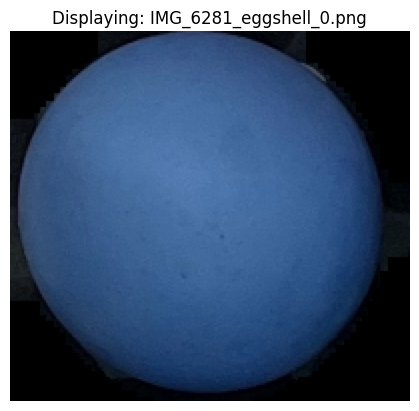

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

OUTPUT_DIR = "/content/drive/MyDrive/ColabNotebooks/ZC-DINO-ER/Part1CropandRemoveBG/IMG/YOLO/HEN"

# List all PNG files
png_files = [f for f in os.listdir(OUTPUT_DIR) if f.endswith(".png")]

if len(png_files) == 0:
    print("No PNG files found in the directory.")
else:
    print(f"Found {len(png_files)} PNG files.")
    file_path = os.path.join(OUTPUT_DIR, png_files[0])  # Pick the first PNG file

    # Read and display the image
    image = cv2.imread(file_path)

    if image is None:
        print(f"⚠️ The file {png_files[0]} is corrupted or empty.")
    else:
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title(f"Displaying: {png_files[0]}")
        plt.show()
